In [1]:
# Import our Rust module
import walker_rust

# Import standard Python modules
# import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
plt.style.use("seaborn")
import pandas as pd
import numpy as np

In [2]:
def do_walk_rust(a, n):
    # Ensure the values being passed to Rust are of the correct type
    a = float(a)
    n = int(n)
    
    # Do a random walk in Rust and return the coordinates and r_squared
    (data, r_squared) = walker_rust.walk(a, n)

    data = pd.DataFrame(data)
    data.columns = ["x", "y", "z"]

    return (data, r_squared)

def do_walk_rust_parallel(a, n, max_seed):
    # Ensure the values being passed to Rust are of the correct type
    a = float(a)
    n = int(n)
    max_seed = int(max_seed)
    
    # Do a random walk in Rust and return the coordinates and r_squared
    r_squared = walker_rust.walk_parallel(a, n, max_seed)

    return r_squared


In [3]:
(data, r_squared) = do_walk_rust(1.1, 100)

fig = go.Figure(data=go.Scatter3d(
    x=data.loc[:, "x"], y=data.loc[:, "y"], z=data.loc[:, "z"],
    marker=dict(
        size=4,
        color=r_squared,
        colorscale='Viridis',
    ),
    line=dict(
        color='darkblue',
        width=2
    )
))

fig.update_layout(
    autosize=False,
    width=1500,
    height=1000,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    paper_bgcolor="White",
)

fig.show()

Pretty graph done. Now we need to do something more quantitative.

Plot r_rms vs n

In [4]:
"""
Credit: https://colab.research.google.com/github/kaityo256/zenn-content/blob/main/articles/msd_fft_python/msd_fft_python.ipynb#scrollTo=JI8U86M99z4O

I switched //4 to //10 so we sample as asked by the activity.
"""

def calc_msd_fft2(x):
    n=len(x)
    fk = np.fft.fft(x, n=2*n)
    power = fk * fk.conjugate()
    res = np.fft.ifft(power)[:n].real
    s2 = res/(n*np.ones(n)-np.arange(0,n))
    x2 = x**2
    s1 = np.zeros(n)
    s1[0] = np.average(x2)*2.0
    for m in range(1,n):
        s1[m] = np.average(x2[m:] + x2[:-m])
    msd = s1 - 2*s2
    return msd[:n//10]

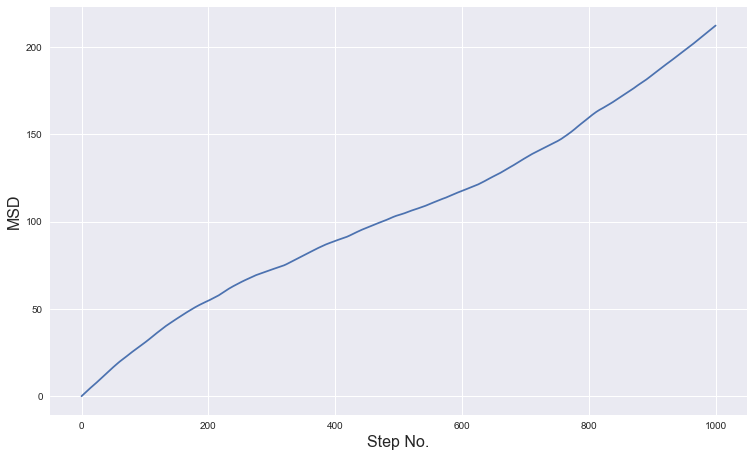

In [5]:
a = 1.1
n = 10000

(data, r_squared) = do_walk_rust(a, n)

r = np.sqrt(r_squared)

msd = calc_msd_fft2(r)

# Create figure
fig = plt.figure()
fig.set_size_inches(12.5, 7.5)
ax = plt.subplot(111)

ax.set_xlabel("Step No.", fontsize = 16)
ax.set_ylabel("MSD", fontsize = 16)

plt.plot(msd)
plt.show()

This is only for one random number seed. Would be better if we could average over an ensemble of random number seeds.

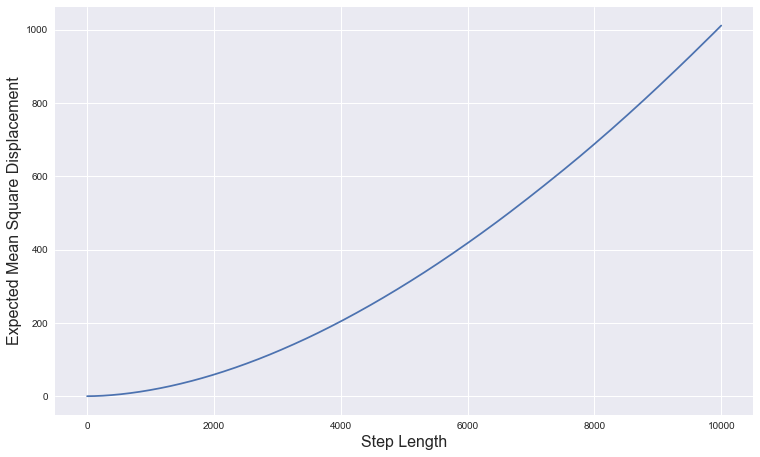

In [6]:
r_squared = do_walk_rust_parallel(1.1, 100000, 1000)

r = np.sqrt(r_squared)

msd = calc_msd_fft2(r)

# Create figure
fig = plt.figure()
fig.set_size_inches(12.5, 7.5)
ax = plt.subplot(111)

ax.set_xlabel("Step Length", fontsize = 16)
ax.set_ylabel("Expected Mean Square Displacement", fontsize = 16)

plt.plot(msd)
plt.show()